In [1]:
import numpy as np
import matplotlib.pyplot as plt
from importlib import reload

In [2]:
plt.style.use('ggplot')
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.labelweight'] = 'heavy'
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.titlesize'] = 12
plt.rcParams['text.usetex']=True
plt.rcParams['animation.html'] = 'html5'

In [88]:
le_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-1400/"

In [3]:
ap = 2.18095

## With cylindrical metric tensor

In [3]:
A = np.load(le_path+"raw_t-1400.sav.npz_giri_2.py.npz")

In [4]:
for k in A.iterkeys():
    print(k)

giri
rr
th
hamilt_matrix
Lyap_exp


In [5]:
rs = A['rr']
us = A['th']
LE = A['Lyap_exp']

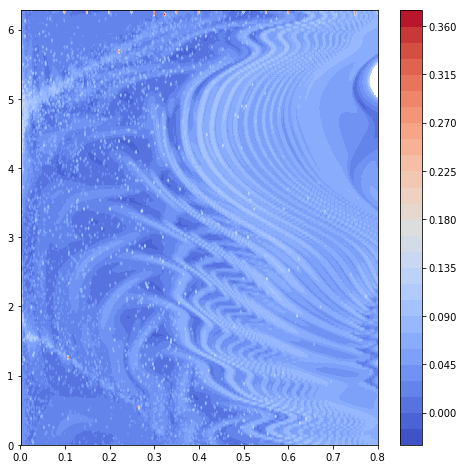

In [15]:
plt.figure(figsize=(8,8))
plt.contourf(rs,us,LE,30,cmap="coolwarm")
plt.colorbar()
plt.show()

## With Numeric Cylindrical metric

In [96]:
C = np.load(le_path+"raw_t-1400.sav.npz_giri_2.py.npz2.py.npz")

In [97]:
rnu = C['rr']
unu = C['th']
LEnu = C['Lyap_exp']

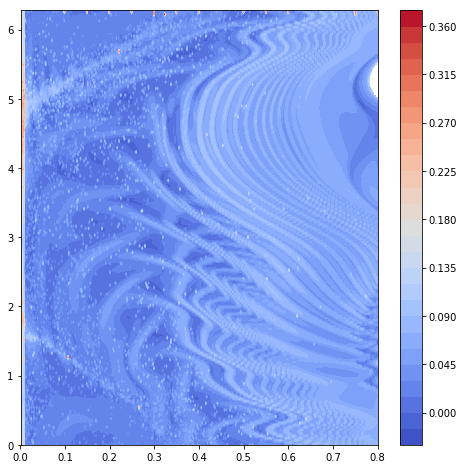

In [98]:
plt.figure(figsize=(8,8))
plt.contourf(rnu,unu,LEnu,30,cmap="coolwarm")
plt.colorbar()
plt.show()

In [99]:
xnu = x_array(rnu,unu)

In [100]:
znu = z_array(rnu,unu)

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


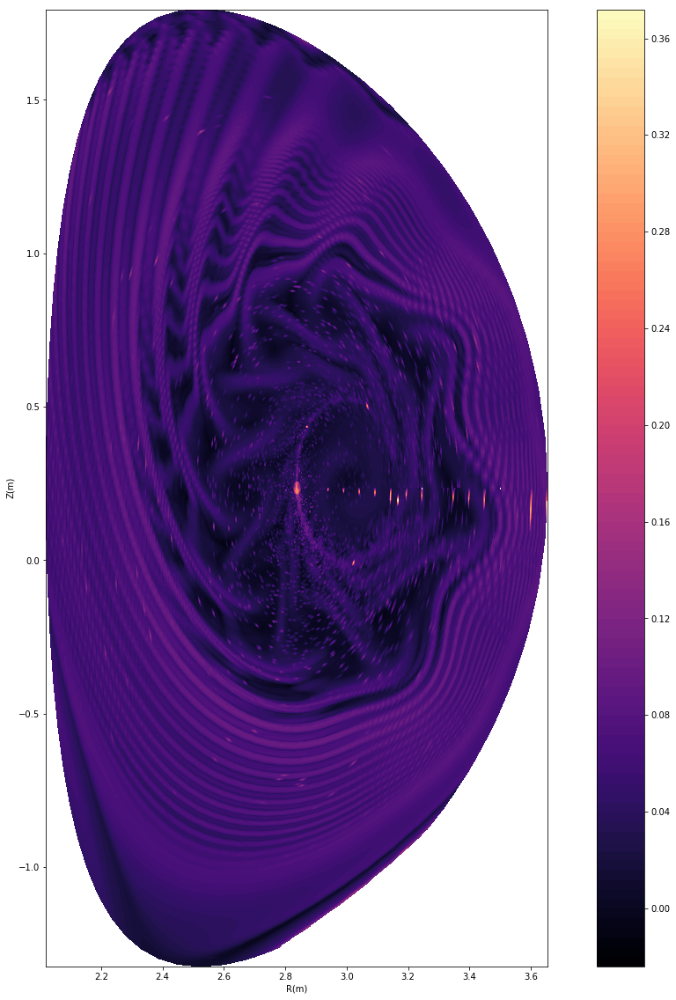

In [101]:
plt.figure(figsize=(20,20))
plt.contourf(xnu,znu,np.swapaxes(LEnu,0,1),100,cmap="magma")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

## With shaped metric tensor

In [16]:
B = np.load(le_path+"raw_t-1400.sav.npz_giri_2.py.npz1.py.npz")

In [17]:
rsh = B['rr']
ush = B['th']
LEsh = B['Lyap_exp']

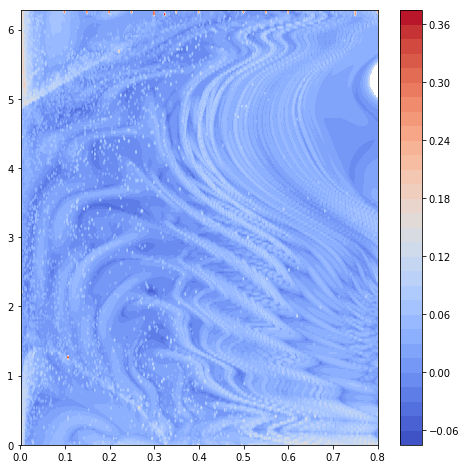

In [18]:
plt.figure(figsize=(8,8))
plt.contourf(rsh,ush,LEsh,30,cmap="coolwarm")
plt.colorbar()
plt.show()

## With Shaped metric (swapped axes)

In [102]:
D = np.load(le_path+"raw_t-1400.sav.npz_giri_2.py.npz3.py.npz")

In [103]:
rsh2 = D['rr']
ush2 = D['th']
LEsh2 = D['Lyap_exp']

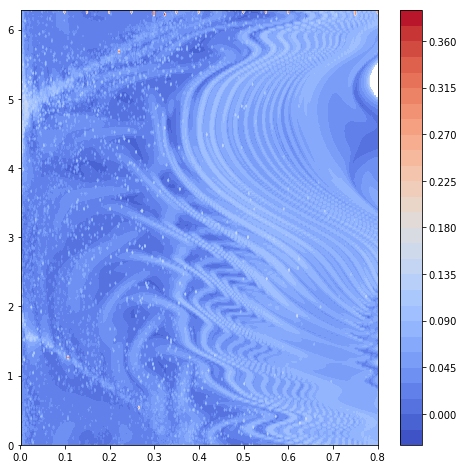

In [104]:
plt.figure(figsize=(8,8))
plt.contourf(rsh2,ush2,LEsh2,30,cmap="coolwarm")
plt.colorbar()
plt.show()

In [105]:
xsh2 = x_array(rsh2,ush2)

In [106]:
zsh2 = z_array(rsh2,ush2)

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


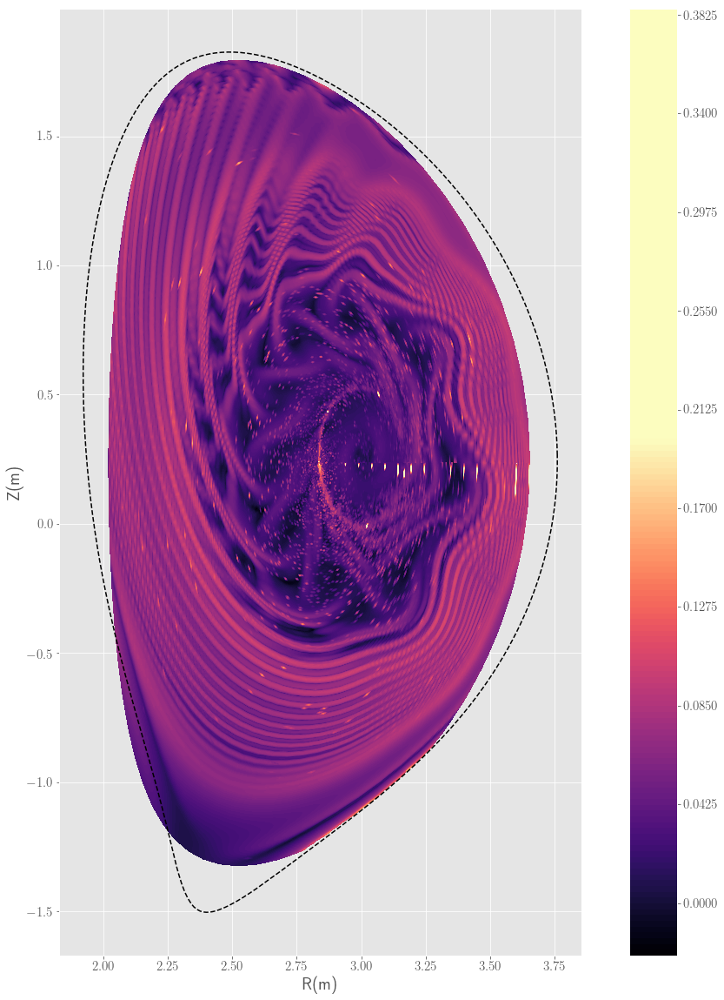

In [121]:
plt.figure(figsize=(20,20))
plt.contourf(xsh2,zsh2,np.swapaxes(LEsh2,0,1),200,vmax = 0.2, cmap="magma")
plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

## Coordinate arrays

In [4]:
import connection_length as cnc

In [5]:
reload(cnc)

<module 'connection_length' from '/users/giannis_kx/python_pixie/connection_length.py'>

In [6]:
filepath = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2.scratch./"

In [7]:
cnc.store_coordinate_arrays(filepath)

In [8]:
X,Z,Psi = cnc.read_coordinates(filepath)

In [9]:
X_int,Z_int,Psi_int = cnc.interpolate(X,Z,Psi)

In [10]:
def x_array(rs,us):
    X = []
    for r in rs:
        for u in us:
            X.append(X_int((r,u,0)))
    X = np.reshape(X,(rs.shape[0],us.shape[0]))
    return X

In [11]:
def z_array(rs,us):
    Z = []
    for r in rs:
        for u in us:
            Z.append(Z_int((r,u,0)))
    Z = np.reshape(Z,(rs.shape[0],us.shape[0]))
    return Z

In [43]:
xs = x_array(rs,us)

In [71]:
zs = z_array(rs,us)

In [45]:
xsh = x_array(rsh,ush)

In [72]:
zsh = z_array(rsh,ush)

### Cylindrical Metric

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


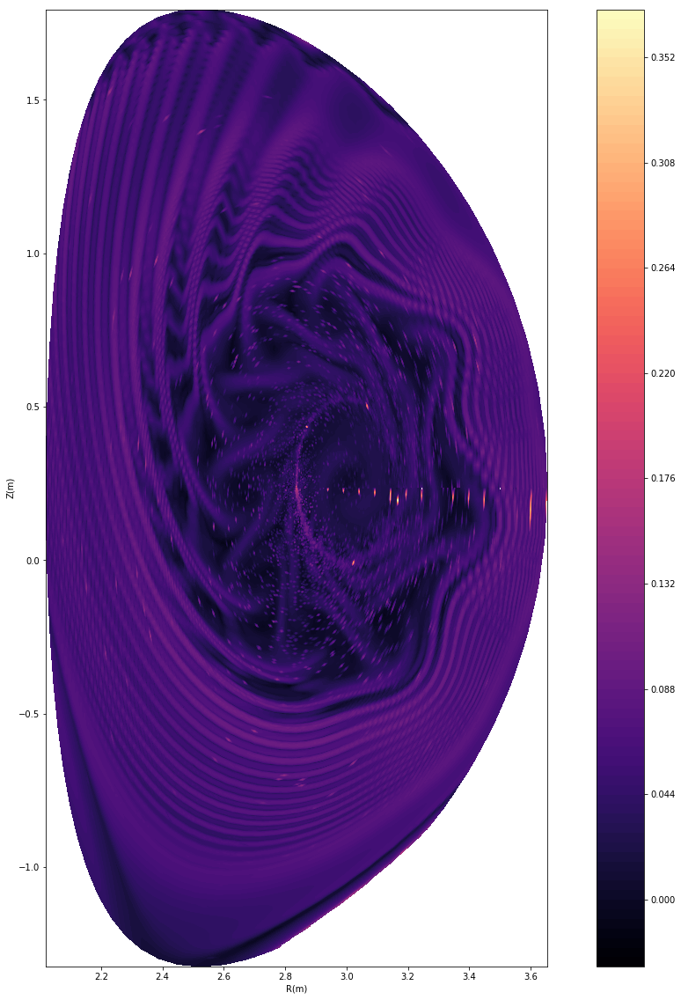

In [86]:
plt.figure(figsize=(20,20))
plt.contourf(xs,zs,np.swapaxes(LE,0,1),100,cmap="magma")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

In [11]:
import poinc

/users/giannis_kx/nemato_config/poinc.py:8: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance


In [112]:
poinc.eqdsk_info()

## Backwards integration

In [124]:
Back = np.load(le_path+"backward/raw_t-1400-back.sav.npz_giri_2.py.npz")

In [132]:
rb = Back['rr']
ub = Back['th']
LEb = Back['Lyap_exp']

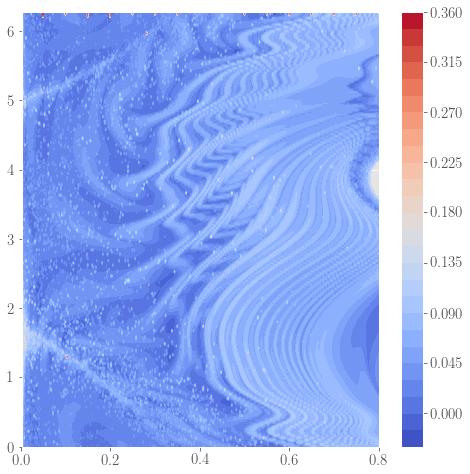

In [126]:
plt.figure(figsize=(8,8))
plt.contourf(rb,ub,LEb,30,cmap="coolwarm")
plt.colorbar()
plt.show()

In [127]:
xb = x_array(rb,ub)

In [133]:
zb = z_array(rb,ub)

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


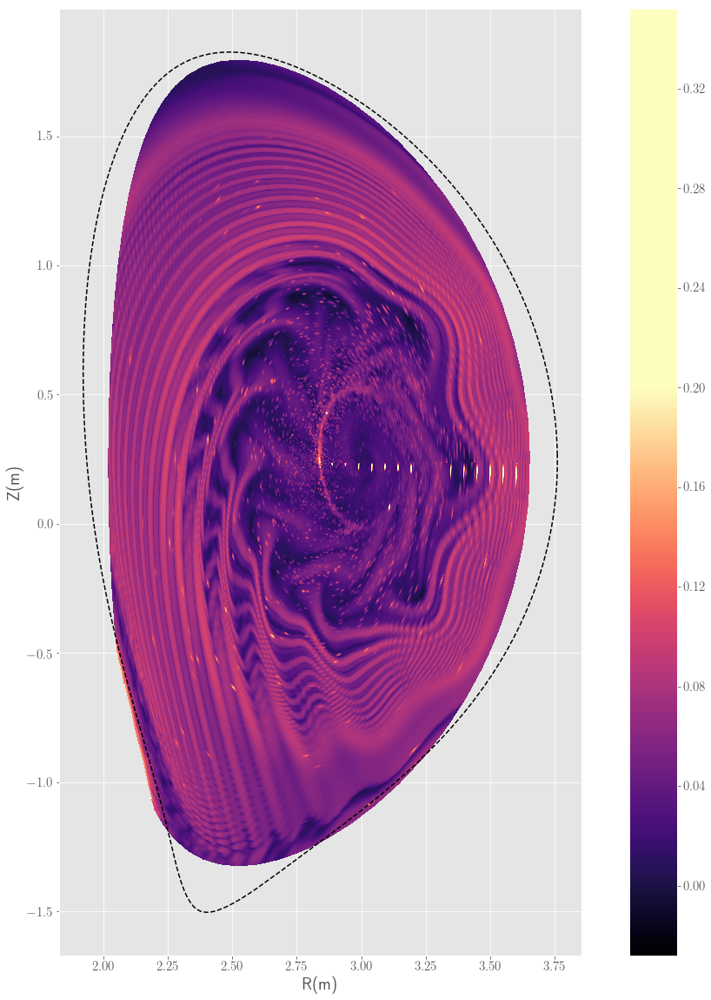

In [154]:
plt.figure(figsize=(20,20))
plt.contourf(xb,zb,np.swapaxes(LEb,0,1),200,vmax = 0.2, cmap="magma")
plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


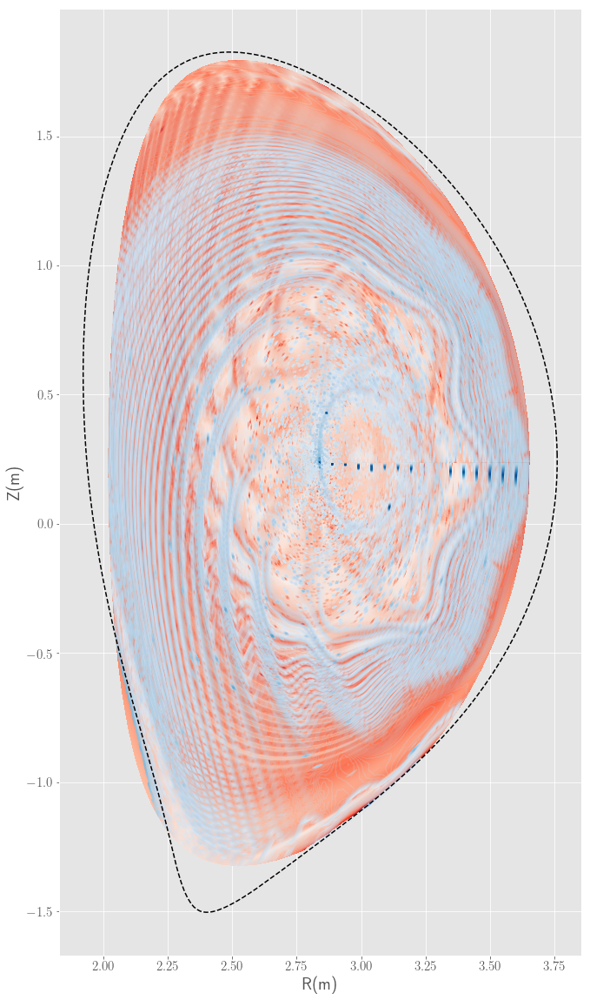

In [169]:
plt.figure(figsize=(20,20))

plt.contourf(xsh2,zsh2,np.swapaxes(LEsh2,0,1),200,vmax = 0.2, cmap="Reds")
plt.contour(xb,zb,np.swapaxes(LEb*5,0,1),200, cmap="Blues",alpha=0.2)
plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
#plt.colorbar()
plt.show()

## t=1410

In [137]:
le1410_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-1410/"

In [139]:
A1410 = np.load(le1410_path+"raw_t-1410.sav.npz_giri_2.py.npz")

In [140]:
rs1410 = A1410['rr']
us1410 = A1410['th']
LE1410 = A1410['Lyap_exp']

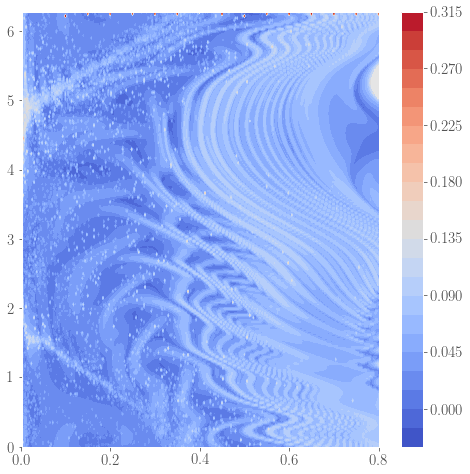

In [141]:
plt.figure(figsize=(8,8))
plt.contourf(rs1410,us1410,LE1410,30,cmap="coolwarm")
plt.colorbar()
plt.show()

In [142]:
x1410 = x_array(rs1410,us1410)

In [143]:
z1410 = z_array(rs1410,us1410)

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


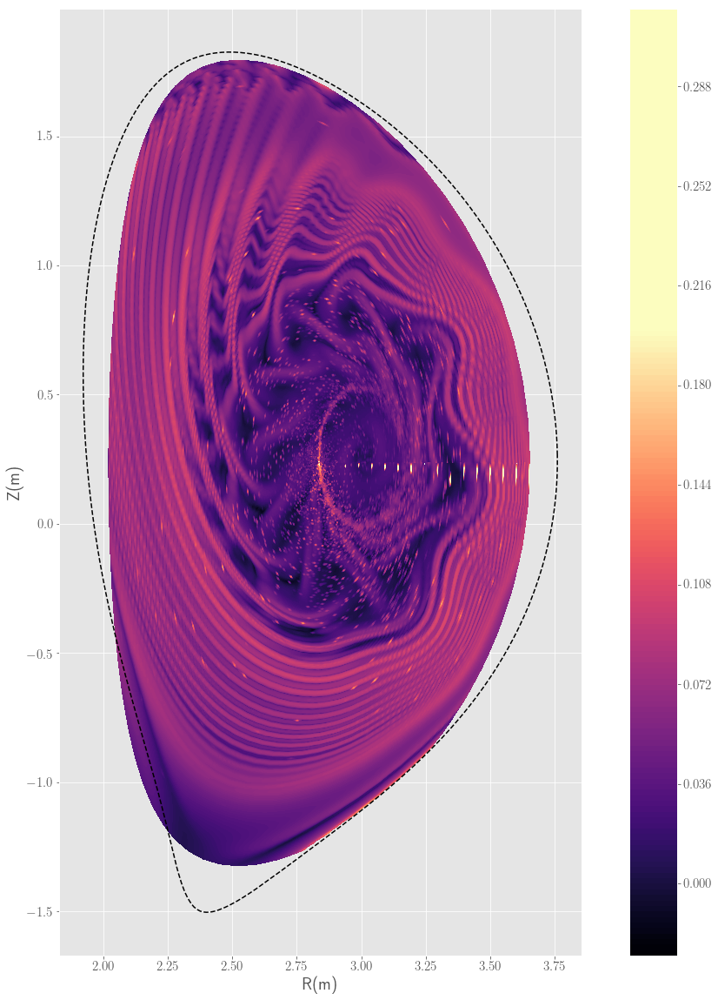

In [144]:
plt.figure(figsize=(20,20))
plt.contourf(x1410,z1410,np.swapaxes(LE1410,0,1),200,vmax = 0.2, cmap="magma")
plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

## t=2000

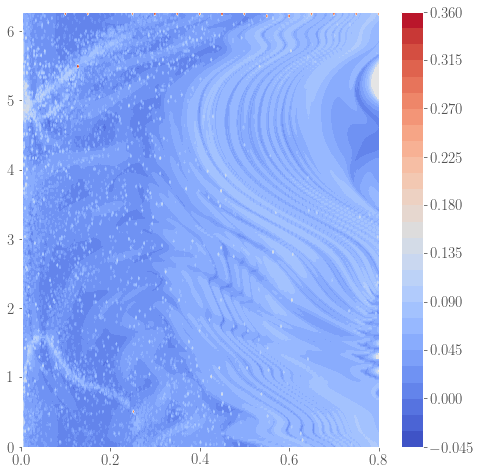

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


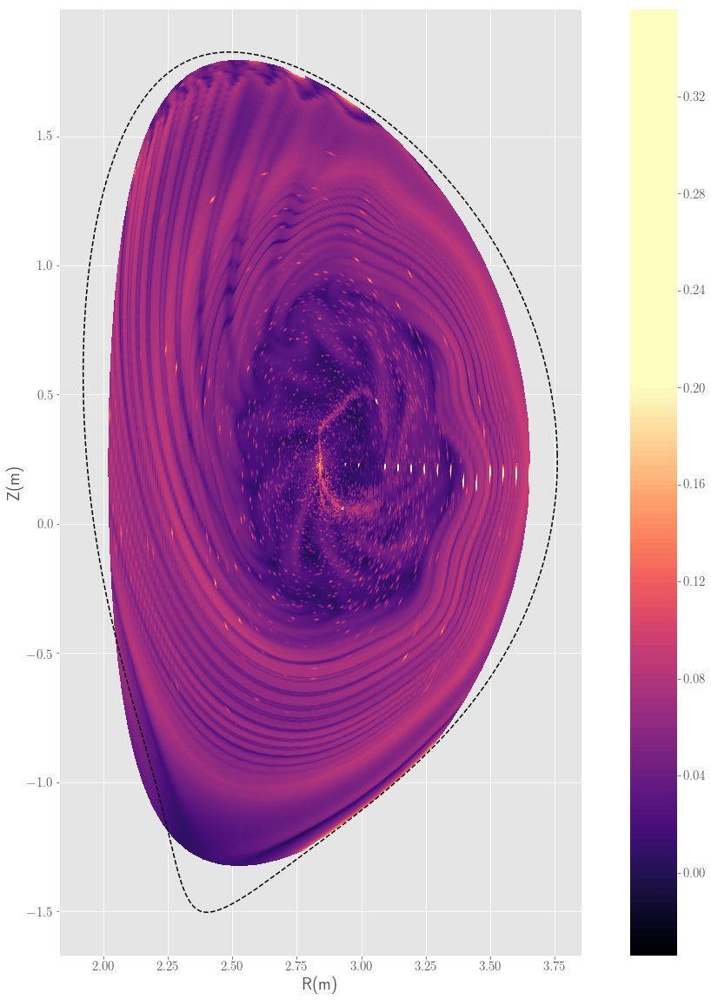

In [146]:
le2000_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-2000/"

A2000 = np.load(le2000_path+"raw_t-2000.sav.npz_giri_2.py.npz")

rs2000 = A2000['rr']
us2000 = A2000['th']
LE2000 = A2000['Lyap_exp']

plt.figure(figsize=(8,8))
plt.contourf(rs2000,us2000,LE2000,30,cmap="coolwarm")
plt.colorbar()
plt.show()

x2000 = x_array(rs2000,us2000)
z2000 = z_array(rs2000,us2000)

plt.figure(figsize=(20,20))
plt.contourf(x2000,z2000,np.swapaxes(LE2000,0,1),200,vmax = 0.2, cmap="magma")
plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

## t=1440

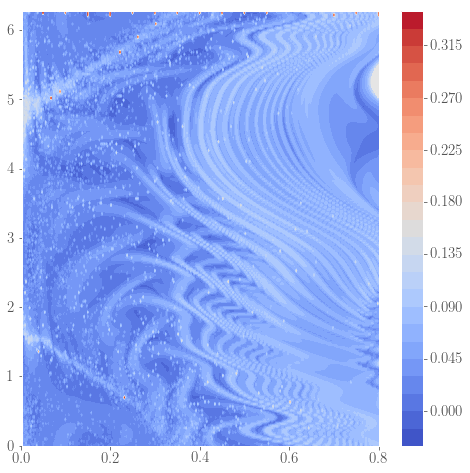

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


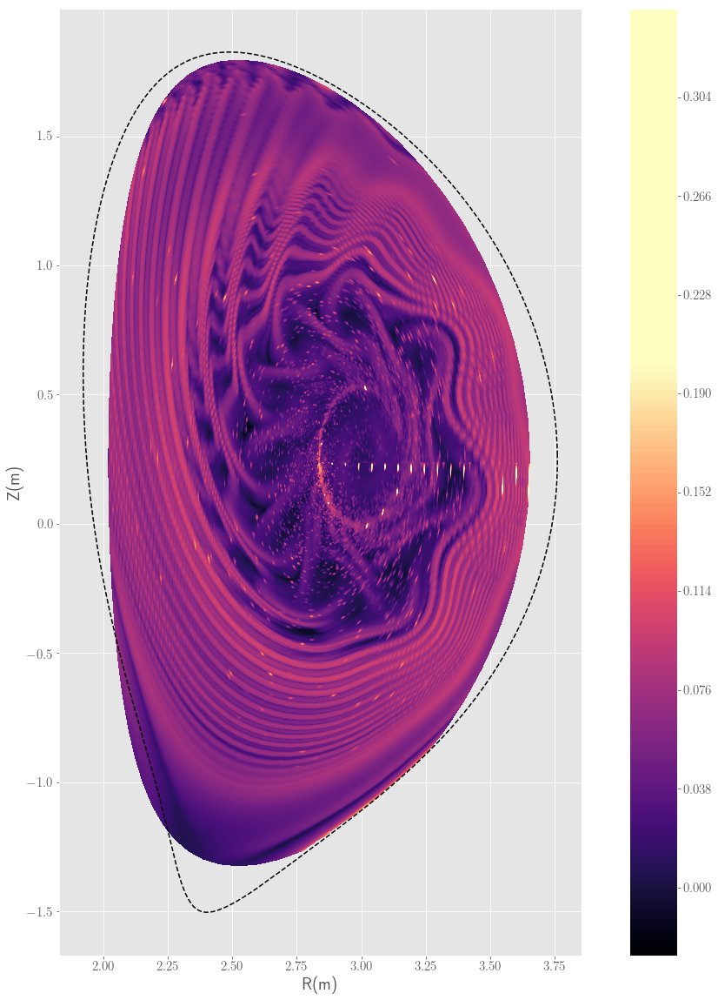

In [147]:
le1440_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-1440/"

A1440 = np.load(le1440_path+"raw_t-1440.sav.npz_giri_2.py.npz")

rs1440 = A1440['rr']
us1440 = A1440['th']
LE1440 = A1440['Lyap_exp']

plt.figure(figsize=(8,8))
plt.contourf(rs1440,us1440,LE1440,30,cmap="coolwarm")
plt.colorbar()
plt.show()

x1440 = x_array(rs1440,us1440)
z1440 = z_array(rs1440,us1440)

plt.figure(figsize=(20,20))
plt.contourf(x1440,z1440,np.swapaxes(LE1440,0,1),200,vmax = 0.2, cmap="magma")
plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

## t=1450

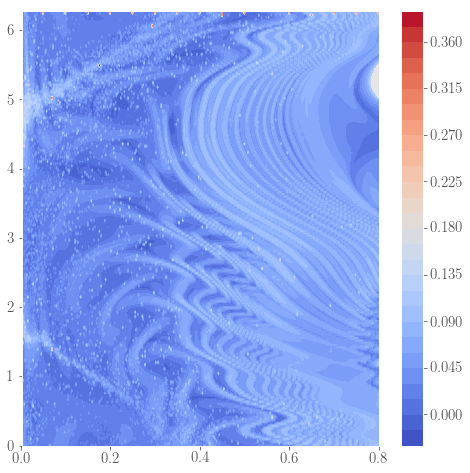

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


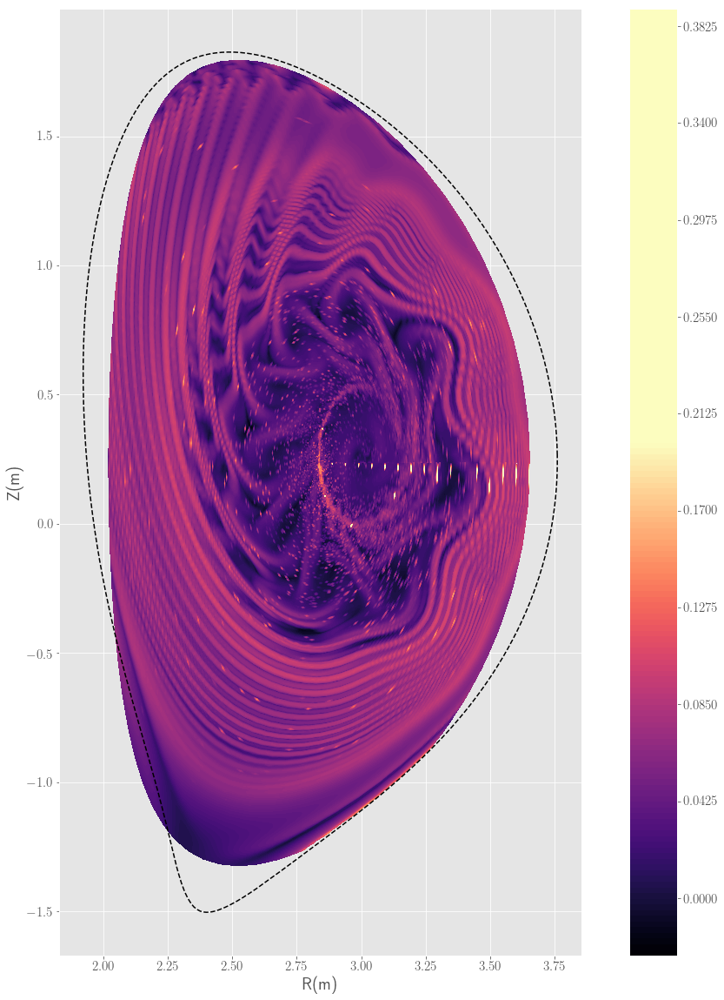

In [149]:
le1450_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-1450/"

A1450 = np.load(le1450_path+"raw_t-1450.sav.npz_giri_2.py.npz")

rs1450 = A1450['rr']
us1450 = A1450['th']
LE1450 = A1450['Lyap_exp']

plt.figure(figsize=(8,8))
plt.contourf(rs1450,us1450,LE1450,30,cmap="coolwarm")
plt.colorbar()
plt.show()

x1450 = x_array(rs1450,us1450)
z1450 = z_array(rs1450,us1450)

plt.figure(figsize=(20,20))
plt.contourf(x1450,z1450,np.swapaxes(LE1450,0,1),200,vmax = 0.2, cmap="magma")
plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

## t=1700

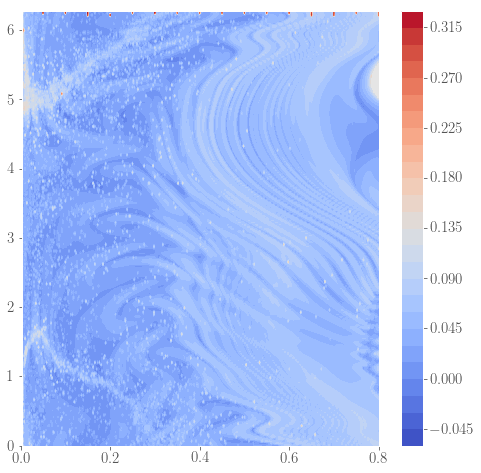

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


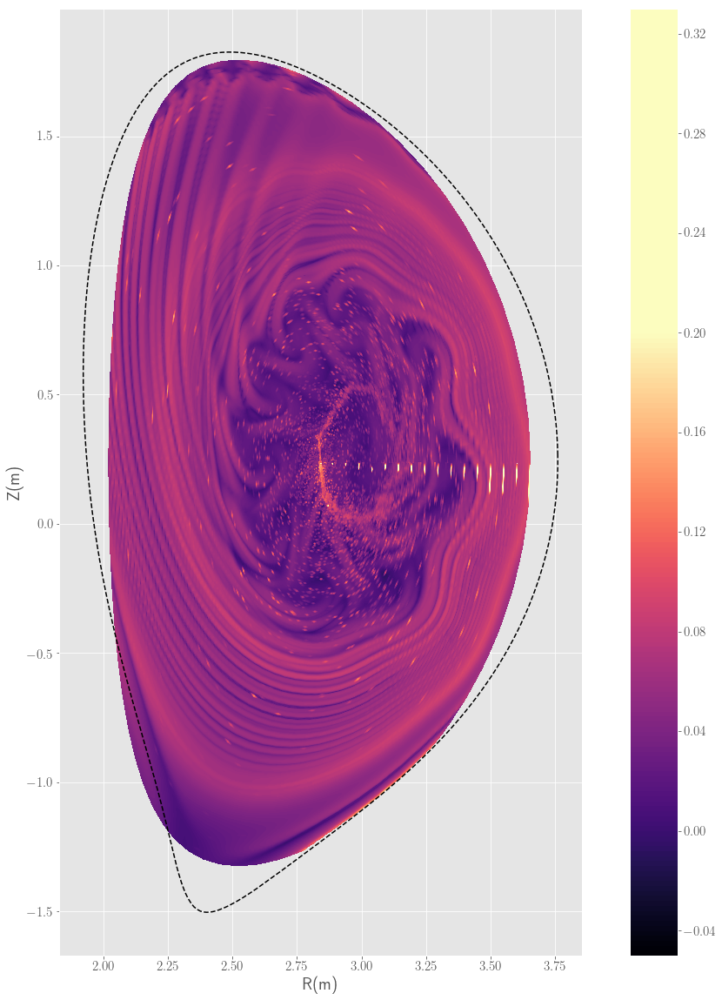

In [151]:
le1700_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-1700/"

A1700 = np.load(le1700_path+"raw_t-1700.sav.npz_giri_2.py.npz")

rs1700 = A1700['rr']
us1700 = A1700['th']
LE1700 = A1700['Lyap_exp']

plt.figure(figsize=(8,8))
plt.contourf(rs1700,us1700,LE1700,30,cmap="coolwarm")
plt.colorbar()
plt.show()

x1700 = x_array(rs1700,us1700)
z1700 = z_array(rs1700,us1700)

plt.figure(figsize=(20,20))
plt.contourf(x1700,z1700,np.swapaxes(LE1700,0,1),200,vmax = 0.2, cmap="magma")
plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

## t=1800

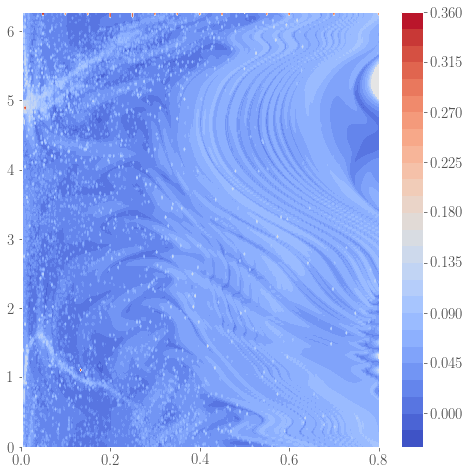

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


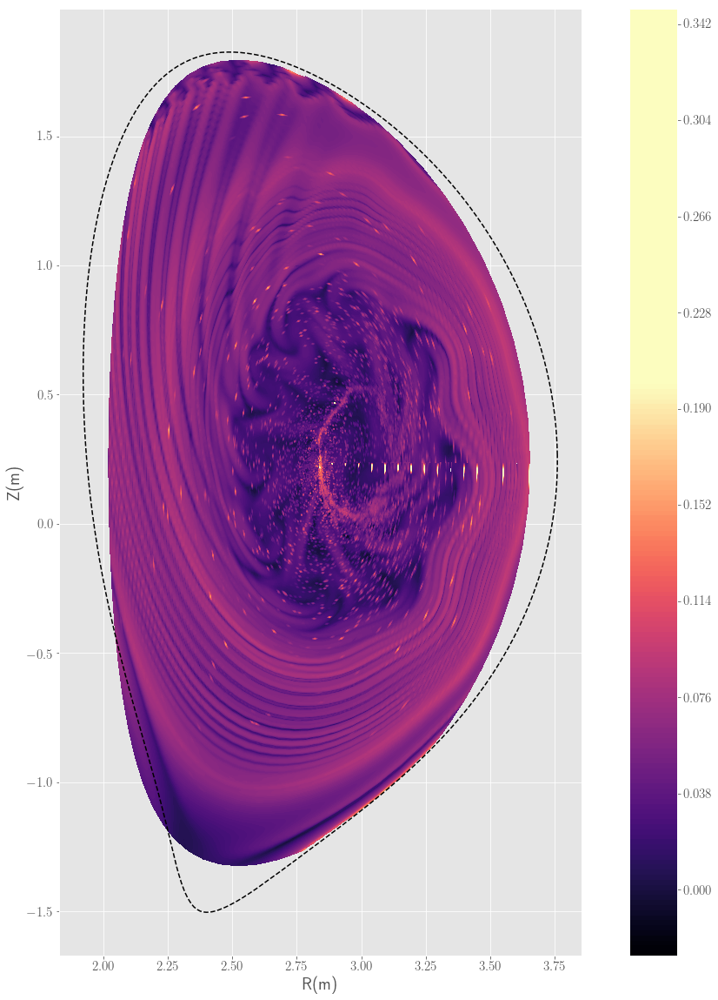

In [152]:
le1800_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-1800/"

A1800 = np.load(le1800_path+"raw_t-1800.sav.npz_giri_2.py.npz")

rs1800 = A1800['rr']
us1800 = A1800['th']
LE1800 = A1800['Lyap_exp']

plt.figure(figsize=(8,8))
plt.contourf(rs1800,us1800,LE1800,30,cmap="coolwarm")
plt.colorbar()
plt.show()

x1800 = x_array(rs1800,us1800)
z1800 = z_array(rs1800,us1800)

plt.figure(figsize=(20,20))
plt.contourf(x1800,z1800,np.swapaxes(LE1800,0,1),200,vmax = 0.2, cmap="magma")
plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

## t=1900

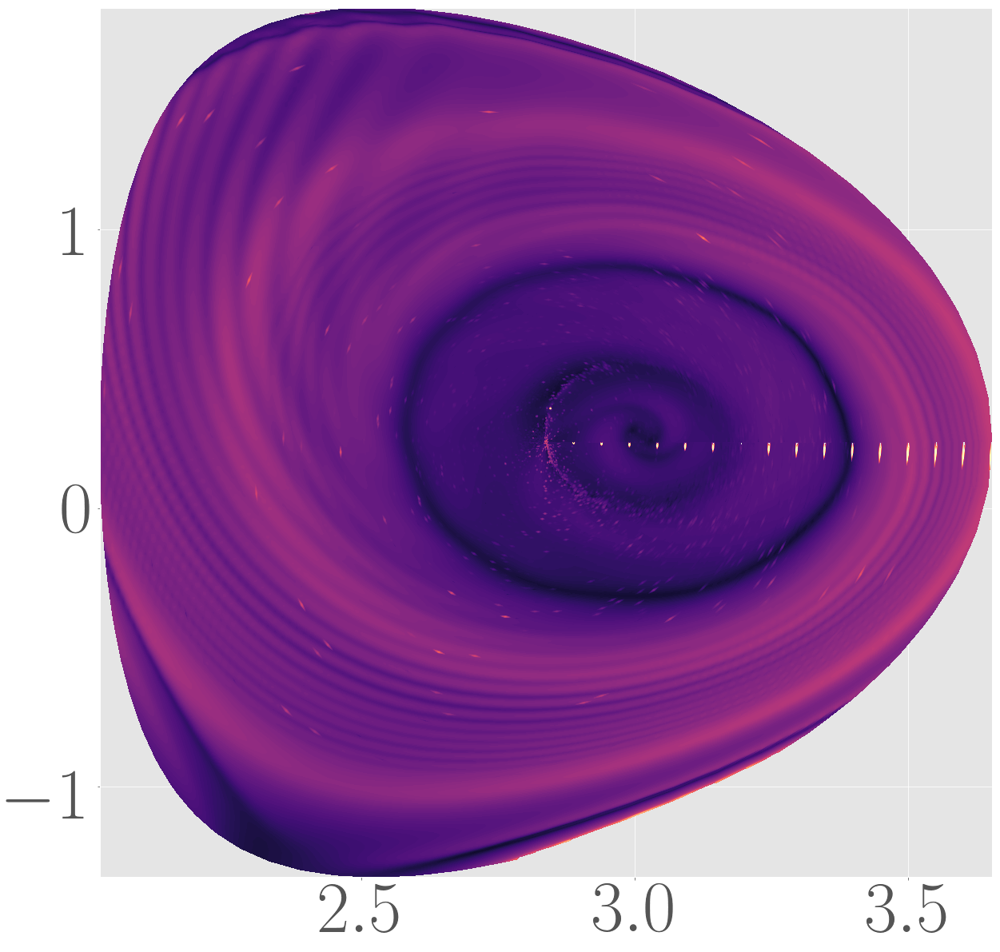

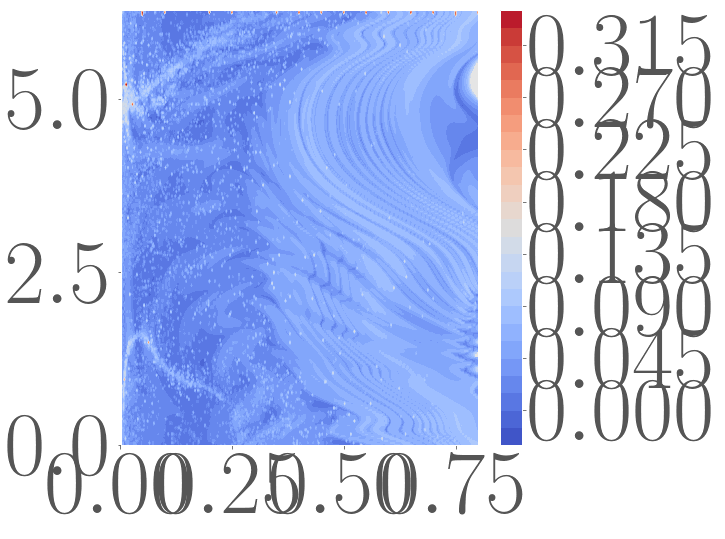

KeyboardInterrupt: 

In [13]:
le1900_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-1900/"

A1900 = np.load(le1900_path+"raw_t-1900.sav.npz_giri_2.py.npz")

rs1900 = A1900['rr']
us1900 = A1900['th']
LE1900 = A1900['Lyap_exp']

plt.figure(figsize=(8,8))
plt.contourf(rs1900,us1900,LE1900,30,cmap="coolwarm")
plt.colorbar()
plt.show()

x1900 = x_array(rs1900,us1900)
z1900 = z_array(rs1900,us1900)

plt.figure(figsize=(20,20))
plt.contourf(x1900,z1900,np.swapaxes(LE1900,0,1),200,vmax = 0.2, cmap="magma")
#plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

## Checking dx resolution

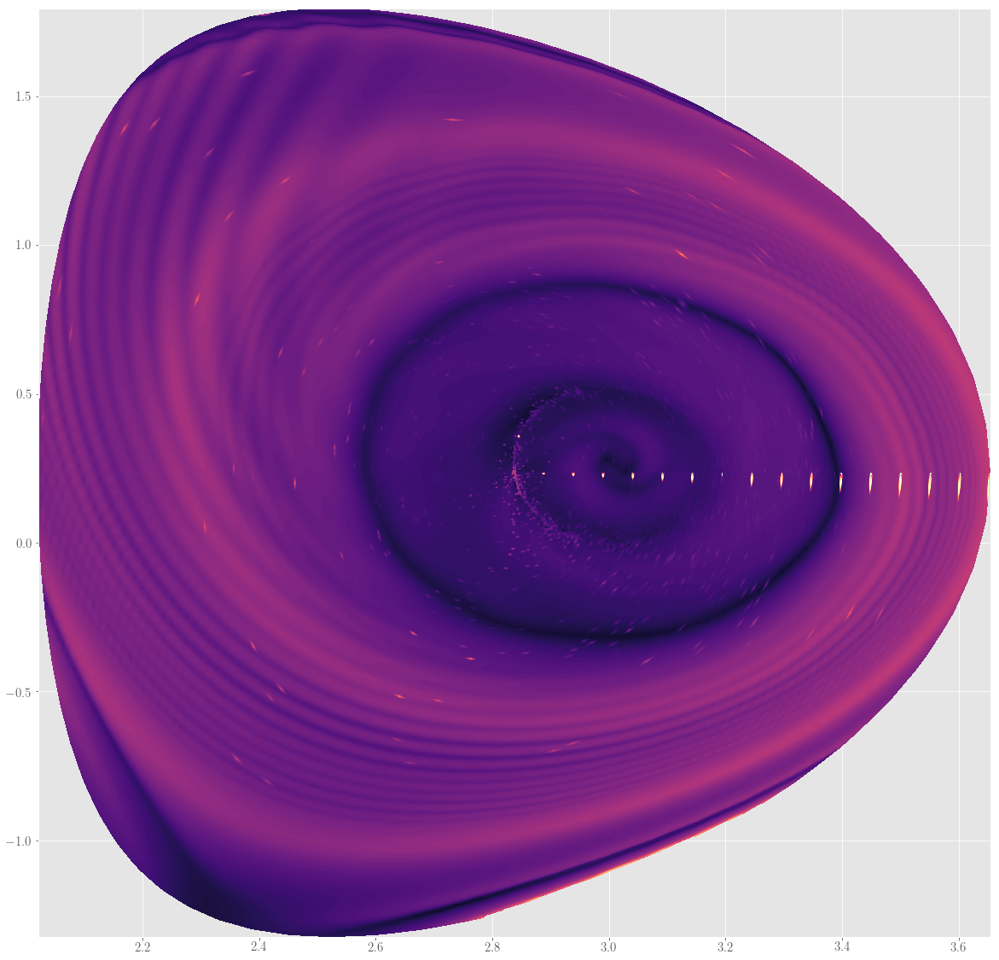

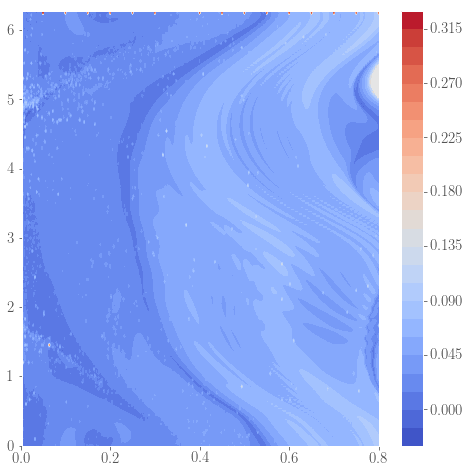

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


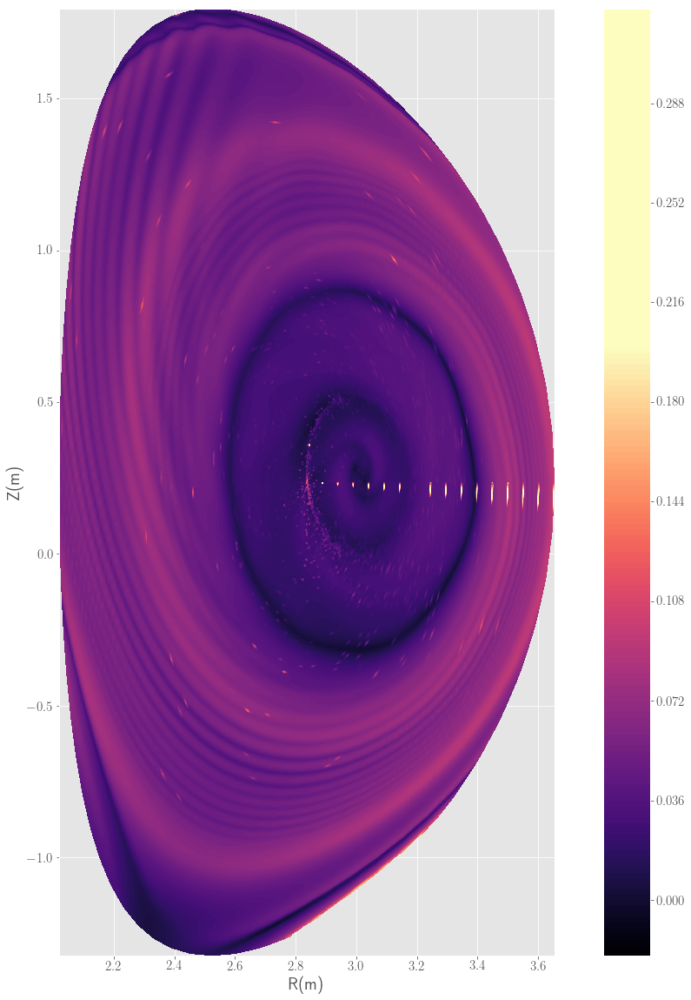

In [13]:
le1055_e6_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-1055/10-6/"

A1055_e6 = np.load(le1055_e6_path+"raw_t-1055-e-6.sav.npz_giri_2.py.npz")

rs1055_e6 = A1055_e6['rr']
us1055_e6 = A1055_e6['th']
LE1055_e6 = A1055_e6['Lyap_exp']

plt.figure(figsize=(8,8))
plt.contourf(rs1055_e6,us1055_e6,LE1055_e6,30,cmap="coolwarm")
plt.colorbar()
plt.show()

x1055_e6 = x_array(rs1055_e6,us1055_e6)
z1055_e6 = z_array(rs1055_e6,us1055_e6)

plt.figure(figsize=(20,20))
plt.contourf(x1055_e6,z1055_e6,np.swapaxes(LE1055_e6,0,1),200,vmax = 0.2, cmap="magma")
#plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

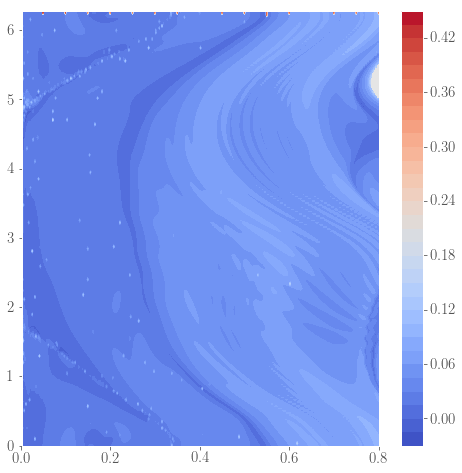

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


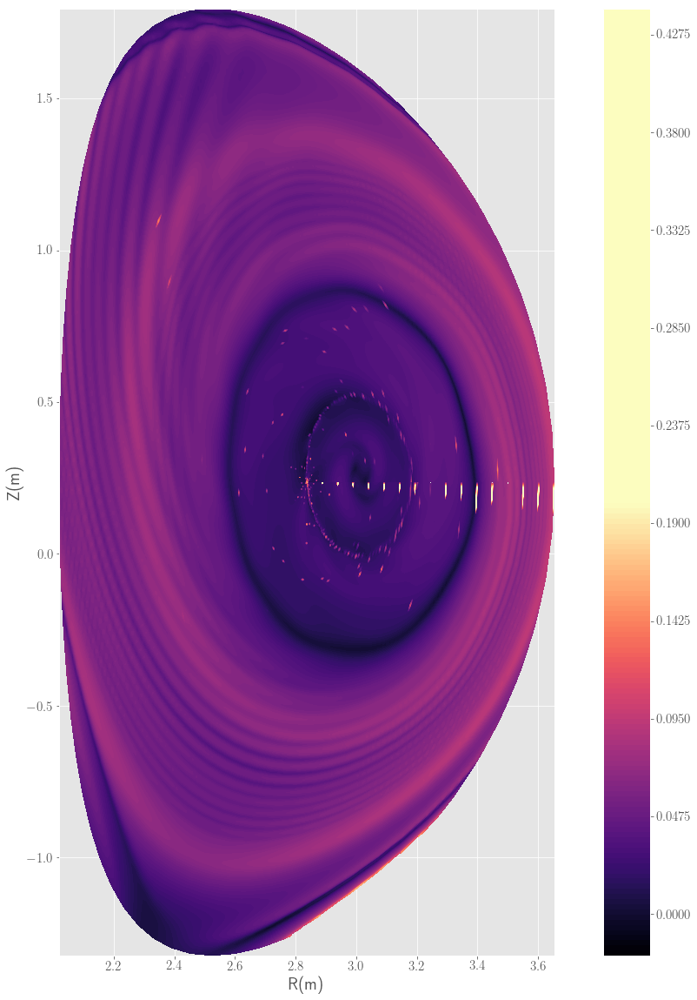

In [14]:
le1055_e8_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-1055/10-8/"

A1055_e8 = np.load(le1055_e8_path+"raw_t-1055-e-8.sav.npz_giri_2.py.npz")

rs1055_e8 = A1055_e8['rr']
us1055_e8 = A1055_e8['th']
LE1055_e8 = A1055_e8['Lyap_exp']

plt.figure(figsize=(8,8))
plt.contourf(rs1055_e8,us1055_e8,LE1055_e8,30,cmap="coolwarm")
plt.colorbar()
plt.show()

x1055_e8 = x_array(rs1055_e8,us1055_e8)
z1055_e8 = z_array(rs1055_e8,us1055_e8)

plt.figure(figsize=(20,20))
plt.contourf(x1055_e8,z1055_e8,np.swapaxes(LE1055_e8,0,1),200,vmax = 0.2, cmap="magma")
#plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

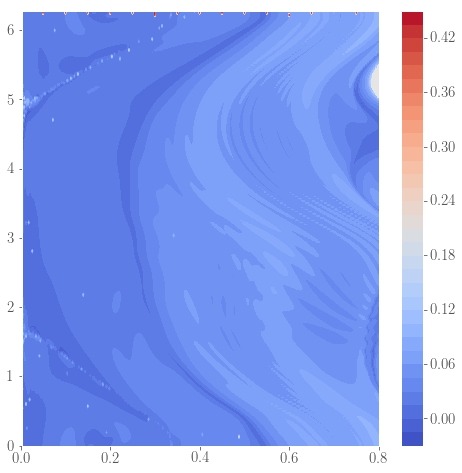

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


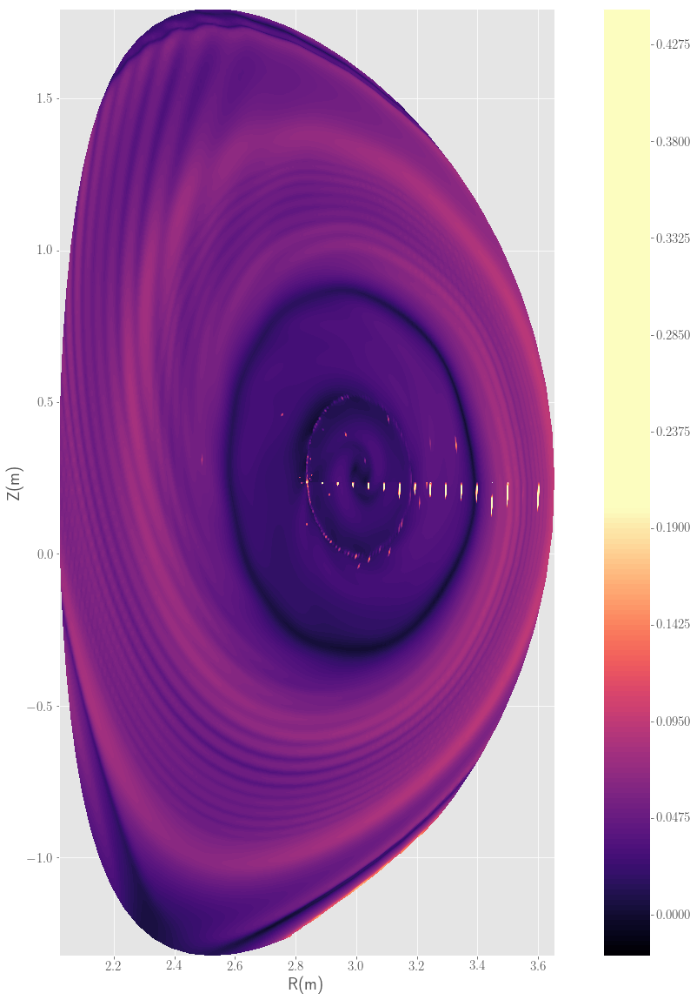

In [15]:
le1055_e9_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-1055/10-9/"

A1055_e9 = np.load(le1055_e9_path+"raw_t-1055-e-9.sav.npz_giri_2.py.npz")

rs1055_e9 = A1055_e9['rr']
us1055_e9 = A1055_e9['th']
LE1055_e9 = A1055_e9['Lyap_exp']

plt.figure(figsize=(8,8))
plt.contourf(rs1055_e9,us1055_e9,LE1055_e9,30,cmap="coolwarm")
plt.colorbar()
plt.show()

x1055_e9 = x_array(rs1055_e9,us1055_e9)
z1055_e9 = z_array(rs1055_e9,us1055_e9)

plt.figure(figsize=(20,20))
plt.contourf(x1055_e9,z1055_e9,np.swapaxes(LE1055_e9,0,1),200,vmax = 0.2, cmap="magma")
#plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()

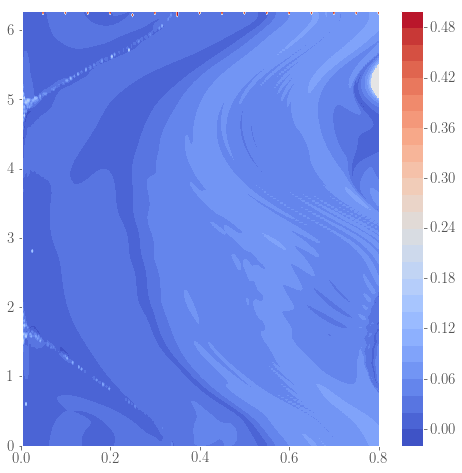

/usr/projects/hpcsoft/toss3/common/anaconda/5.0.1-python-3.6/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


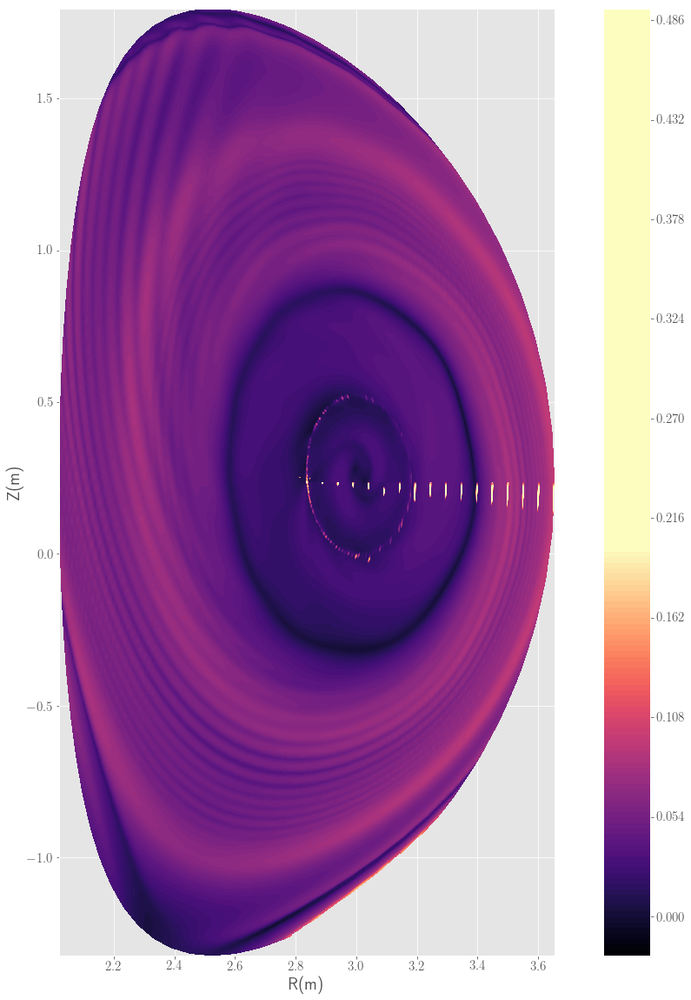

In [16]:
le1055_e10_path = "/lustre/scratch4/turquoise/giannis_kx/pixie3d/iter/db_tear/dt2-ftle/t-1055/10-10/"

A1055_e10 = np.load(le1055_e10_path+"raw_t-1055-e-10.sav.npz_giri_2.py.npz")

rs1055_e10 = A1055_e10['rr']
us1055_e10 = A1055_e10['th']
LE1055_e10 = A1055_e10['Lyap_exp']

plt.figure(figsize=(8,8))
plt.contourf(rs1055_e10,us1055_e10,LE1055_e10,30,cmap="coolwarm")
plt.colorbar()
plt.show()

x1055_e10 = x_array(rs1055_e10,us1055_e10)
z1055_e10 = z_array(rs1055_e10,us1055_e10)

plt.figure(figsize=(20,20))
plt.contourf(x1055_e10,z1055_e10,np.swapaxes(LE1055_e10,0,1),200,vmax = 0.2, cmap="magma")
#plt.plot([x/ap for x in poinc.m.DS.rbbbs],[y/ap for y in poinc.m.DS.zbbbs],"k--")
plt.xlabel('R(m)')
plt.ylabel('Z(m)')
plt.axes().set_aspect("equal")
plt.colorbar()
plt.show()